In [1]:
import numpy as np
import pandas as pd
from PIL import Image

In [2]:
# url = "https://github.com/ardhiraka/PFDS_sources/blob/master/Canada.xlsx?raw=true"
url = "../data/Canada.xlsx"
df_can = pd.read_excel(
    url, sheet_name="Canada by Citizenship", skiprows=range(20), skipfooter=2
)

In [3]:
df_can.head()

,Type,Coverage,OdName,AREA,AreaName,REG,RegName,DEV,DevName,1980,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,Immigrants,Foreigners,Afghanistan,935,Asia,5501,Southern Asia,902,Developing regions,16,...,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004
1,Immigrants,Foreigners,Albania,908,Europe,925,Southern Europe,901,Developed regions,1,...,1450,1223,856,702,560,716,561,539,620,603
2,Immigrants,Foreigners,Algeria,903,Africa,912,Northern Africa,902,Developing regions,80,...,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331
3,Immigrants,Foreigners,American Samoa,909,Oceania,957,Polynesia,902,Developing regions,0,...,0,0,1,0,0,0,0,0,0,0
4,Immigrants,Foreigners,Andorra,908,Europe,925,Southern Europe,901,Developed regions,0,...,0,0,1,1,0,0,0,0,1,1


In [4]:
df_can.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 43 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Type      195 non-null    object
 1   Coverage  195 non-null    object
 2   OdName    195 non-null    object
 3   AREA      195 non-null    int64 
 4   AreaName  195 non-null    object
 5   REG       195 non-null    int64 
 6   RegName   195 non-null    object
 7   DEV       195 non-null    int64 
 8   DevName   195 non-null    object
 9   1980      195 non-null    int64 
 10  1981      195 non-null    int64 
 11  1982      195 non-null    int64 
 12  1983      195 non-null    int64 
 13  1984      195 non-null    int64 
 14  1985      195 non-null    int64 
 15  1986      195 non-null    int64 
 16  1987      195 non-null    int64 
 17  1988      195 non-null    int64 
 18  1989      195 non-null    int64 
 19  1990      195 non-null    int64 
 20  1991      195 non-null    int64 
 21  1992      195 no

In [6]:
df_can.shape

(195, 43)

In [7]:
df_can.describe()

,AREA,REG,DEV,1980,1981,1982,1983,1984,1985,1986,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,912.764103,1249.015385,901.753846,508.394872,566.989744,534.723077,387.435897,376.497436,358.861538,441.271795,...,1190.169231,1320.292308,1266.958974,1191.820513,1246.394872,1275.733333,1420.287179,1262.533333,1313.958974,1320.702564
std,13.082835,1185.526885,0.431878,1949.588546,2152.643752,1866.997511,1204.333597,1198.246371,1079.309600,1225.576630,...,3710.505369,4425.957828,3926.717747,3443.542409,3694.573544,3829.630424,4462.946328,4030.084313,4247.555161,4237.951988
min,903.000000,905.000000,901.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,903.000000,914.000000,902.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,...,19.000000,28.500000,25.000000,31.000000,31.000000,36.000000,40.500000,37.500000,42.500000,45.000000
50%,908.000000,922.000000,902.000000,13.000000,10.000000,11.000000,12.000000,13.000000,17.000000,18.000000,...,191.000000,210.000000,218.000000,198.000000,205.000000,214.000000,211.000000,179.000000,233.000000,213.000000
75%,922.000000,925.500000,902.000000,251.500000,295.500000,275.000000,173.000000,181.000000,197.000000,254.000000,...,756.500000,832.000000,842.000000,899.000000,934.500000,888.000000,932.000000,772.000000,783.000000,796.000000
max,935.000000,5501.000000,902.000000,22045.000000,24796.000000,20620.000000,10015.000000,10170.000000,9564.000000,9470.000000,...,36619.000000,42584.000000,33848.000000,28742.000000,30037.000000,29622.000000,38617.000000,36765.000000,34315.000000,34129.000000


In [ ]:
df_can = df_can.drop(["AREA", "REG", "DEV"], axis=1, errors="ignore")
df_can = df_can.drop(["Type", "Coverage"], axis=1, errors="ignore")
mapper = {
    "OdName": "Country",
    "AreaName": "Continent",
    "RegName": "Region",
}
df_can = df_can.rename(mapper=mapper, axis=1)
df_can = df_can.set_index("Country", drop=True)
df_can["Total"] = df_can[range(1980, 2014)].sum(axis=1)
df_can.head()

,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,496,...,3436,3009,2652,2111,1746,1758,2203,2635,2004,58639
Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,1,...,1223,856,702,560,716,561,539,620,603,15699
Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,69,...,3626,4807,3623,4005,5393,4752,4325,3774,4331,69439
American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,6
Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,2,...,0,1,1,0,0,0,0,1,1,15


## Matplotlib


In [8]:
import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

mpl.style.use("ggplot")

### Waffle Chart


In [26]:
df_dsn = df_can.loc[["Denmark", "Norway", "Sweden"]]
df_dsn

,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Country,,,,,,,,,,,,,,,,,,,,,
Denmark,Europe,Northern Europe,Developed regions,272,293,299,106,93,73,93,...,62,101,97,108,81,92,93,94,81,3901
Norway,Europe,Northern Europe,Developed regions,116,77,106,51,31,54,56,...,57,53,73,66,75,46,49,53,59,2327
Sweden,Europe,Northern Europe,Developed regions,281,308,222,176,128,158,187,...,205,139,193,165,167,159,134,140,140,5866


In [48]:
category_proportions = (df_dsn["Total"] / df_dsn["Total"].sum()).to_list()
category_proportions

[0.32255663965602777, 0.1924094592359848, 0.48503390110798744]

In [49]:
category_proportions = [value / df_dsn["Total"].sum() for value in df_dsn["Total"]]
category_proportions

[np.float64(0.32255663965602777),
 np.float64(0.1924094592359848),
 np.float64(0.48503390110798744)]

In [51]:
category_proportions = []
for value in df_dsn["Total"]:
    category_proportions.append(value / df_dsn["Total"].sum())
category_proportions

[np.float64(0.32255663965602777),
 np.float64(0.1924094592359848),
 np.float64(0.48503390110798744)]

In [52]:
width = 40
height = 10

total_num_tiles = width * height

total_num_tiles

400

In [69]:
tiles_per_category = np.array(category_proportions) * total_num_tiles
tiles_per_category = np.round(tiles_per_category)
tiles_per_category

6.21 μs ± 965 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


In [70]:
tiles_per_category = []
for i in category_proportions:
    tiles_per_category.append(round(i * total_num_tiles))
tiles_per_category

7.92 μs ± 1.92 μs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [77]:
waffle_chart = np.zeros((height, width))
print(waffle_chart.shape)
waffle_chart

(10, 40)


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
   

In [83]:
tiles_per_category

array([129.,  77., 194.])

In [84]:
df_dsn.index

Index(['Denmark', 'Norway', 'Sweden'], dtype='object', name='Country')

In [92]:
tiles_per_category[:1].sum()

np.float64(129.0)

In [93]:
tiles_per_category[:2].sum()

np.float64(206.0)

In [94]:
tiles_per_category[:3].sum()

np.float64(400.0)

In [ ]:
1, 2, 3, ..., 400

In [147]:
category_index = 1
tile_index = 0

for col in range(width):  # 40
    for row in range(height):  # 10
        tile_index += 1

        if tile_index > sum(tiles_per_category[:category_index]):
            category_index += 1

        waffle_chart[row, col] = category_index

waffle_chart

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2.,
        2., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
        3., 3., 3., 3., 3., 3., 3., 3.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2.,
        2., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
        3., 3., 3., 3., 3., 3., 3., 3.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2.,
        2., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
        3., 3., 3., 3., 3., 3., 3., 3.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2.,
        2., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
        3., 3., 3., 3., 3., 3., 3., 3.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2.,
        2., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
        3., 3., 3., 3., 3., 3., 3., 3.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2.,
   

In [148]:
waffle_chart[:, :13]

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.]])

In [149]:
waffle_chart[:, 12:25]

array([[1., 2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3., 3.],
       [1., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3., 3.],
       [2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 3., 3.]])

In [150]:
waffle_chart[:, 24:]

array([[3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.],
       [3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.]])

In [151]:
tiles_per_category

array([129.,  77., 194.])

<Figure size 640x480 with 0 Axes>

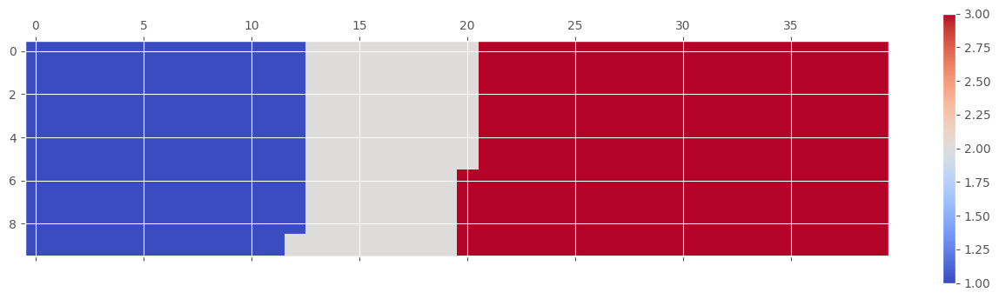

In [152]:
fig = plt.figure()
colormap = plt.cm.coolwarm
plt.matshow(waffle_chart, cmap=colormap)
plt.colorbar()
plt.show()

In [135]:
np.arange(-0.5, (width), 1)

array([-0.5,  0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5,
       10.5, 11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5,
       21.5, 22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5,
       32.5, 33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5])

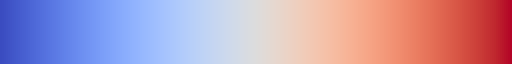

In [236]:
colormap

In [194]:
for i, category in enumerate(df_dsn.index):
    print(i, category)


0 Denmark
1 Norway
2 Sweden


<Figure size 640x480 with 0 Axes>

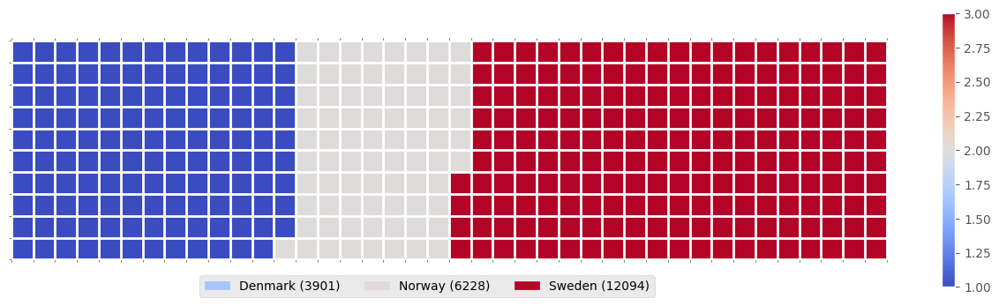

In [235]:
fig = plt.figure()

colormap = plt.cm.coolwarm
plt.matshow(waffle_chart, cmap=colormap)
plt.colorbar()

ax = plt.gca()

ax.set_xticks(np.arange(-0.5, (width), 1), minor=True)
ax.set_yticks(np.arange(-0.5, (height), 1), minor=True)

ax.grid(which="minor", color="w", linestyle="-", linewidth=2)

plt.xticks([])
plt.yticks([])

values_cumsum = df_dsn["Total"].cumsum().to_list()
total_values = df_dsn["Total"].sum()

legend_handles = []
for i, category in enumerate(df_dsn.index):
    label = f"{category} ({values_cumsum[i]})"
    color_val = colormap(values_cumsum[i] / total_values)
    legend_handle = mpatches.Patch(color=color_val, label=label)
    legend_handles.append(legend_handle)

plt.legend(
    handles=legend_handles,
    loc="lower center",
    ncol=len(values_cumsum),
    bbox_to_anchor=[0, -0.2, 0.95, 1],
)
plt.show()

### Wordcloud


In [237]:
from wordcloud import STOPWORDS, WordCloud

In [255]:
with open("../data/alice_novel.txt", "r") as f:
    alice_novel = f.read()

In [285]:
alice_wc = WordCloud(
    background_color="white",
    max_words=2000,
    stopwords=STOPWORDS,
)

alice_wc.generate(alice_novel)

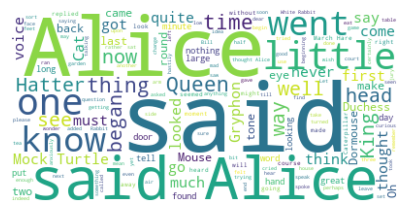

In [292]:
plt.figure(figsize=(5, 8))
plt.imshow(alice_wc, interpolation="bilinear")
plt.axis("off")
plt.show()

In [295]:
alice_mask = np.array(Image.open("../data/alice_mask.png"))

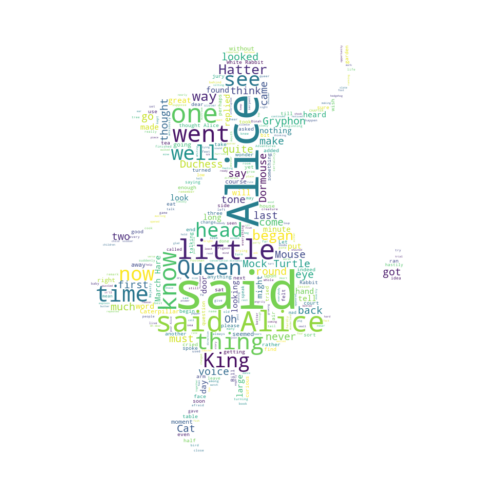

In [312]:
alice_wc = WordCloud(
    background_color="white",
    max_words=2000,
    mask=alice_mask,
    stopwords=STOPWORDS,
)
alice_wc.generate(alice_novel)

plt.figure(figsize=(8, 6))

plt.imshow(alice_wc, interpolation="bilinear")
plt.axis("off")
plt.show()

In [316]:
df_can["Total"].sort_values(ascending=False)

Country
India                                                   691904
China                                                   659962
United Kingdom of Great Britain and Northern Ireland    551500
Philippines                                             511391
Pakistan                                                241600
                                                         ...  
New Caledonia                                                5
San Marino                                                   5
Marshall Islands                                             2
Western Sahara                                               2
Palau                                                        1
Name: Total, Length: 195, dtype: int64

In [318]:
total_immigration = df_can["Total"].sum()
total_immigration

np.int64(6409153)

In [335]:
(df_can["Total"] / df_can["Total"].sum() * 90).astype(int).sort_values(ascending=False)

Country
China                                                   9
India                                                   9
Philippines                                             7
United Kingdom of Great Britain and Northern Ireland    7
Pakistan                                                3
                                                       ..
Venezuela (Bolivarian Republic of)                      0
Western Sahara                                          0
Yemen                                                   0
Zambia                                                  0
Zimbabwe                                                0
Name: Total, Length: 195, dtype: int64

In [362]:
max_words = 90
word_string = ""
for country in df_can.index:
    if len(country.split(" ")) > 1:
        continue
    repeat_num_times = int(df_can.loc[country, "Total"] / df_can["Total"].sum() * 90)
    word_string += f"{country} " * repeat_num_times

word_string

'China China China China China China China China China Colombia Egypt France Guyana Haiti India India India India India India India India India Jamaica Lebanon Morocco Pakistan Pakistan Pakistan Philippines Philippines Philippines Philippines Philippines Philippines Philippines Poland Portugal Romania '

In [363]:
wordcloud = WordCloud(background_color="white").generate(word_string)

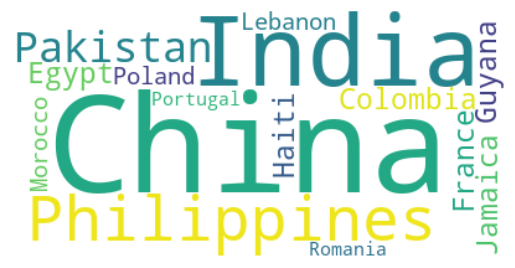

In [364]:
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Regression Plots


In [365]:
import seaborn as sns

In [377]:
df_tot = pd.DataFrame(df_can[range(1980, 2014)].sum())
df_tot = df_tot.reset_index()
df_tot.columns = ["year", "total"]
df_tot.head()

,year,total
0,1980,99137
1,1981,110563
2,1982,104271
3,1983,75550
4,1984,73417


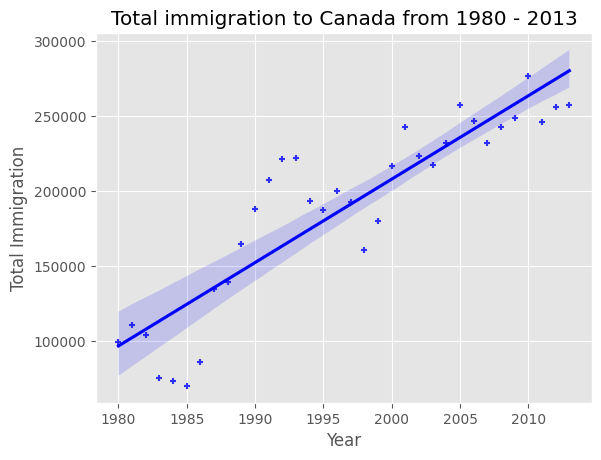

In [ ]:
sns.regplot(
    data=df_tot,
    x="year",
    y="total",
    color="blue",
    marker="+",
    scatter_kws={"s": 20},
)

plt.xlabel("Year")
plt.ylabel("Total Immigration")
plt.title("Total immigration to Canada from 1980 - 2013")
plt.show()

## Folium


In [392]:
import folium

In [394]:
world_map = folium.Map()

In [401]:
world_map = folium.Map(location=[-6.992620, 110.428009], zoom_start=20)

In [417]:
world_map = folium.Map(location=[-6.992620, 110.428009], zoom_start=13, tiles="CyclOSM")

In [419]:
url = "https://raw.githubusercontent.com/ardhiraka/PFDS_sources/refs/heads/master/Police_Department_Incidents_-_Previous_Year__2016_.csv"
url = "../data/Police_Department_Incidents_-_Previous_Year__2016_.csv"
df_incidents = pd.read_csv(url)

In [420]:
df_incidents.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


In [423]:
latitude = 37.77
longitude = -122.42

In [425]:
sanfran_map = folium.Map(location=[latitude, longitude], zoom_start=12)
sanfran_map

In [430]:
df_incidents.iloc[0].Y

np.float64(37.775420706711)

In [440]:
incidents = folium.map.FeatureGroup()

for lat, lng, label in zip(
    df_incidents.Y[:10000], df_incidents.X[:10000], df_incidents.Category[:10000]
):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color="yellow",
            fill=True,
            fill_color="blue",
            fill_opacity=0.6,
        )
    )


sanfran_map.add_child(incidents)